In [1]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN

In [2]:
#A simple show function for ease
def show(I,cmap="gray",save=False,name=None):
    plt.imshow(I, cmap=cmap)
    plt.axis("off")
    if save:
        plt.imsave(name,I)
    plt.show()

In [3]:
#A simple class object for performance and ease of use, dataset link can be found on report.
class ImageRetriever:
    def __init__(self, directory):
        self.directory = directory
        self.image_dict = {}
        self.load_images()

    def load_images(self):
        for filename in os.listdir(self.directory):
            if "_" in filename and filename.endswith(".png"):
                parts = filename.split("_")
                index = int(parts[0])
                letter = parts[1][0]
                self.image_dict[(index, letter)] = os.path.join(self.directory, filename)

    def get_image(self, index, letter):
        key = (index, letter)
        image_path = self.image_dict[key]
        image = cv2.imread(image_path)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        return image_rgb

Below cell takes forged images and return \
1) The images with two rectangles are drawned aroud the detected regions
2) Those boundaries

In [4]:
def detect_and_draw(I_original):
    I = np.copy(I_original)
    # Convert to grayscale
    I_gray = cv2.cvtColor(I, cv2.COLOR_RGB2GRAY)

    # Create SIFT object with adjusted thresholds
    sift = cv2.SIFT_create(contrastThreshold=0.01, edgeThreshold=15)

    # Apply Gaussian blur for better feature detection
    #I_gray = cv2.GaussianBlur(I_gray, sigmaX=1.6, ksize=(5, 5))

    # Detect keypoints and compute descriptors
    keypoints, descriptors = sift.detectAndCompute(I_gray, None)

    # Match descriptors within the same image using FLANN-based matcher
    index_params = dict(algorithm=1, trees=5)  # FLANN parameters
    search_params = dict(checks=150)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(descriptors, descriptors, k=3)

    # Apply Lowe's ratio test for filtering matches
    good_matches = []
    for m, n, z in matches:
        if n.distance < 0.32 * z.distance:  # Adjust ratio threshold if necessary
            good_matches.append(n)

    # Extract matched keypoint coordinates
    points = np.float32([keypoints[m.queryIdx].pt for m in good_matches])
    match_pairs = [(keypoints[m.queryIdx].pt, keypoints[m.trainIdx].pt) for m in good_matches]

    if len(points) > 0:
        # Apply DBSCAN clustering
        eps = 20  # Maximum distance between points in a cluster
        min_samples = 2  # Minimum number of points to form a cluster
        dbscan = DBSCAN(eps=eps, min_samples=min_samples).fit(points)

        # Get cluster labels (-1 indicates noise)
        labels = dbscan.labels_
        boundaries = []
        # Visualize clusters on the image
        unique_labels = set(labels)
        for label in unique_labels:
            if label == -1:
                # Skip noise points
                continue
            # Get all points in the cluster
            cluster_points = points[labels == label]

            # Draw bounding box around the cluster
            x_min, y_min = np.min(cluster_points, axis=0).astype(int)
            x_max, y_max = np.max(cluster_points, axis=0).astype(int)
            cv2.rectangle(I, (x_min, y_min), (x_max, y_max), (0, 255, 0), 2)
            boundaries.append([(x_min, y_min), (x_max, y_max)])
            
            # Draw cluster points
            for point in cluster_points:
                x, y = point.astype(int)
                cv2.circle(I, (x, y), 5, (0, 0, 255), -1)

        # Draw lines between matched keypoints
        for pt1, pt2 in match_pairs:
            x1, y1 = map(int, pt1)
            x2, y2 = map(int, pt2)
            cv2.line(I, (x1, y1), (x2, y2), (255, 0, 0), 1)  # Blue line for matches

    else:
        print("Not enough good matches to detect copied regions.")

    return I,boundaries

Segmentation Around the Image

In [ ]:
from torchvision import models
import torch
from PIL import Image
from torchvision import transforms

# Load pre-trained DeepLabV3+ model
model = models.segmentation.deeplabv3_resnet101(pretrained=True)
model.eval()

# Preprocess image
preprocess = transforms.Compose([
    transforms.Resize((520, 520)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


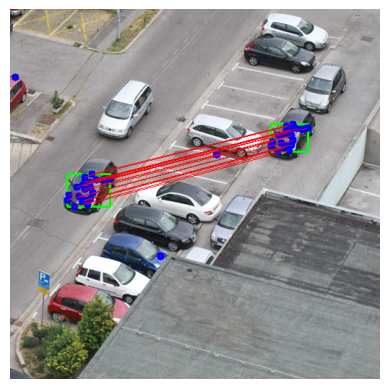

In [42]:
images = ImageRetriever("simple_images")
#Here is the first ten smaples:
i=100
image = images.get_image(i+1,"F")
mask = images.get_image(i+1,"B")
detected_image,boundaries = detect_and_draw(image)
show(detected_image)

Below cell is for the segmnetation of the image on the detecetd region. We use a pre-trained model, DeepLabV3+

In [7]:
dist1 = lambda min,max : (max[0]-min[0])+(max[1]-min[1])

In [32]:
def detection_segmentation(image,boundaries):
    distances = [dist1(min,max) for min,max in boundaries]
    sorted_indices = sorted(range(len(distances)), key=lambda i: distances[i], reverse=True)
    mask_detected = np.zeros(image.shape[:2])
    
    try:
        (xmin, ymin), (xmax, ymax) = boundaries[sorted_indices[0]]
        e = 20
        imageseg1 = image[ymin-e:ymax+e,xmin-e:xmax+e]
        sx,sy = imageseg1.shape[:2]
        input_image = Image.fromarray(imageseg1)
        input_tensor = preprocess(input_image).unsqueeze(0)
        
        # Perform inference
        with torch.no_grad():
            output = model(input_tensor)['out'][0]
        segmentation1 = torch.argmax(output, dim=0).numpy()
        segmentation1 = np.clip(segmentation1,0,1)
        if segmentation1.mean() == 0:
            segmentation1 = 1-segmentation1
        
        segmentation1 = segmentation1.copy()
        segmentation1 = cv2.resize(segmentation1.astype(np.uint8),(sy,sx),interpolation=cv2.INTER_NEAREST)
        mask_detected[ymin-e:ymax+e,xmin-e:xmax+e] = segmentation1
    
        (xmin, ymin), (xmax, ymax) = boundaries[sorted_indices[1]]
        e = 20
        imageseg2 = image[ymin-e:ymax+e,xmin-e:xmax+e]
        sx,sy = imageseg2.shape[:2]
    
        input_image = Image.fromarray(imageseg2)
        input_tensor = preprocess(input_image).unsqueeze(0)
        
        # Perform inference
        with torch.no_grad():
            output = model(input_tensor)['out'][0]
        segmentation2 = torch.argmax(output, dim=0).numpy()
        segmentation2 = np.clip(segmentation2,0,1)
        if segmentation2.mean() == 0:
            segmentation2= 1-segmentation2
            
        segmentation2 = segmentation2.copy()
        segmentation2 = cv2.resize(segmentation2.astype(np.uint8),(sy,sx),interpolation=cv2.INTER_NEAREST)
        mask_detected[ymin-e:ymax+e,xmin-e:xmax+e] = segmentation2
    except:
        None

    return mask_detected


In [33]:
def scores(D,GT):
    e = 1e-6
    d1 = D == 1
    d0 = D == 0
    gt1 = GT == 1
    gt0 = GT == 0
    goodness_score = (d1&gt1).sum()/(d1|gt1).sum()
    tp = (d1&gt1).sum()
    fp = (d1&gt0).sum()
    fn = (d0&gt1).sum()
    tn = (d0&gt0).sum()
    precision = tp/(tp+fp+e)
    recall = tp/(tp+fn+e)
    accuracy = (tp+tn)/(tp+tn+fp+fn)
    f1 = 2*precision*recall/(precision+recall+e)
    return [accuracy,precision,recall,f1,goodness_score]

In [ ]:
images = ImageRetriever("simple_images")
score_list = []
#Here is the first ten smaples:
for i in range(200):
    image = images.get_image(i+1,"F")
    mask = images.get_image(i+1,"B")[:,:,0]/255
    im_name = str(i+1).rjust(3,"0")+"_S.png"
    detected_image,boundaries = detect_and_draw(image)
    mask_d = detection_segmentation(image,boundaries)
    plt.imsave(im_name,mask_d,cmap="gray")
    score_list.append(scores(mask_d,mask))
    print(f"%{i/2:.4f}",end="\r")

Here are the accuracy scores:

In [35]:
print(f"Accuracy: {np.mean([i[0] for i in score_list])}")
print(f"Precision: {np.mean([i[1] for i in score_list])}")
print(f"Recall: {np.mean([i[2] for i in score_list])}")
print(f"F-1 score: {np.mean([i[3] for i in score_list])}")
print(f"Goodness-score: {np.mean([i[4] for i in score_list])}")

Accuracy: 0.9575887695693303
Precision: 0.5218682610428776
Recall: 0.4699790939499317
F-1 score: 0.42914310822882357
Goodness-score: 0.3218415954781462


In [72]:
np.where((np.array([i[3] for i in score_list]) > 0.6) & (np.array([i[3] for i in score_list]) < 0.8))

(array([  0,   1,  10,  11,  13,  16,  20,  25,  28,  33,  34,  38,  43,
         46,  52,  53,  57,  61,  67,  72,  77,  79,  83,  85,  87,  92,
         99, 101, 105, 109, 112, 113, 114, 118, 120, 121, 126, 129, 130,
        136, 146, 147, 156, 157, 160, 168, 181, 183, 184, 187, 188, 192,
        194, 199]),)

6


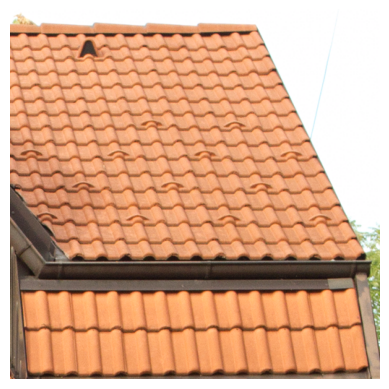

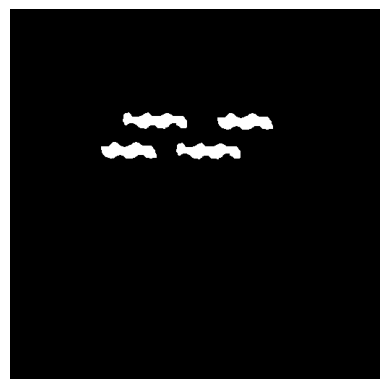

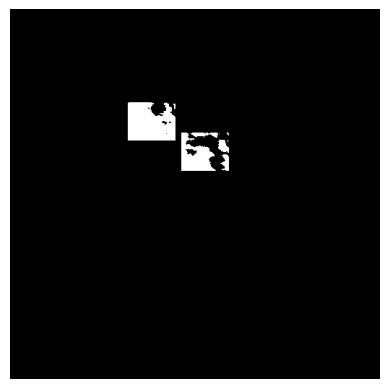

12


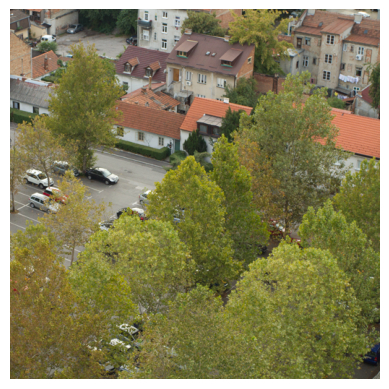

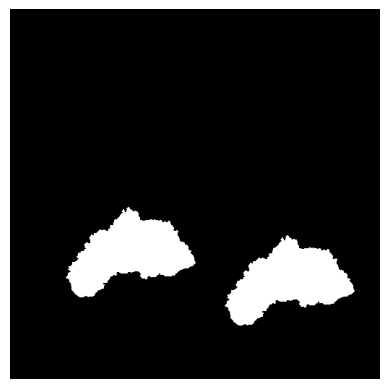

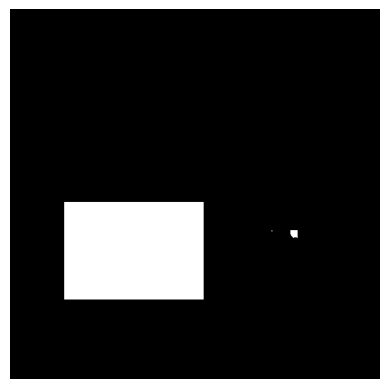

14


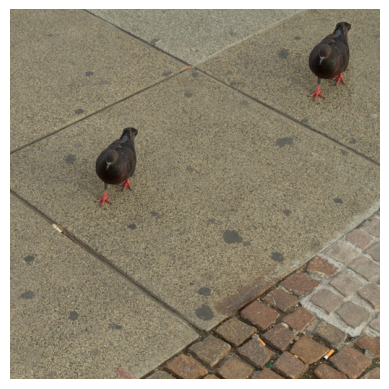

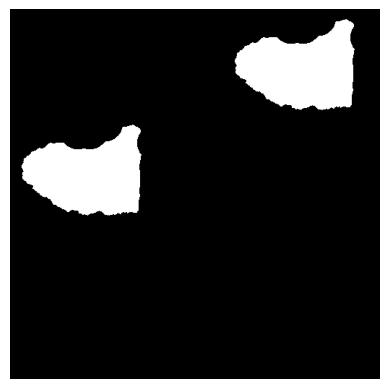

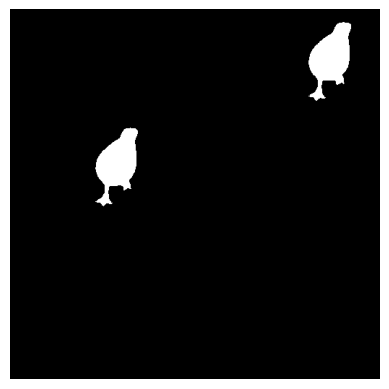

17


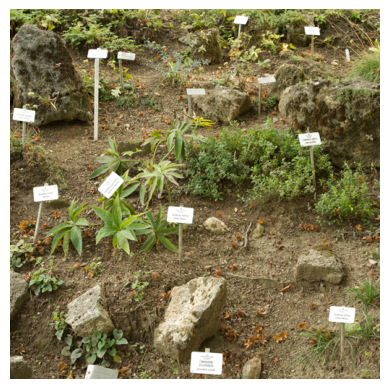

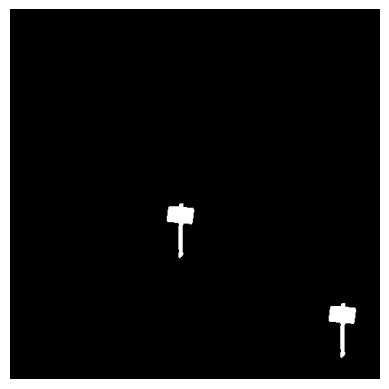

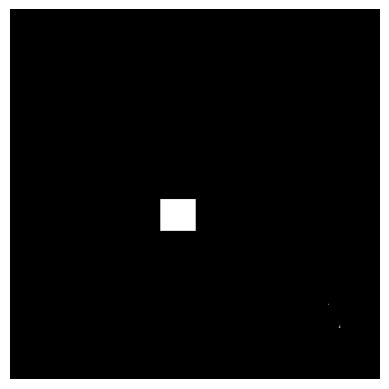

26


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


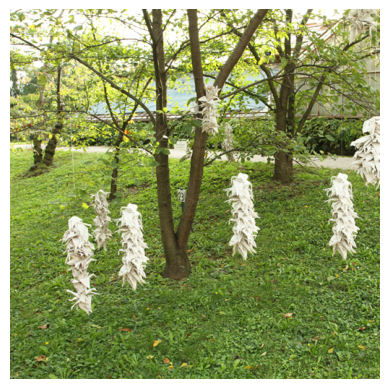

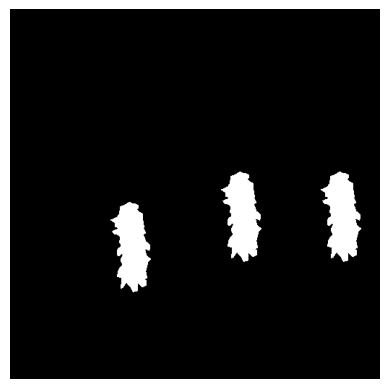

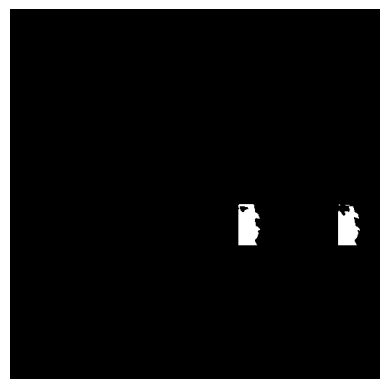

27


libpng warning: iCCP: known incorrect sRGB profile


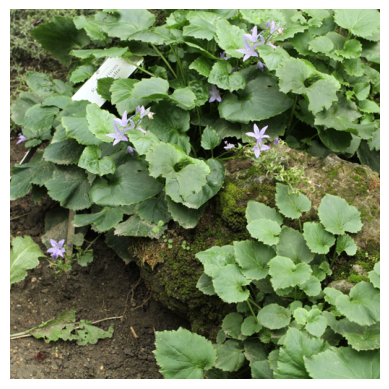

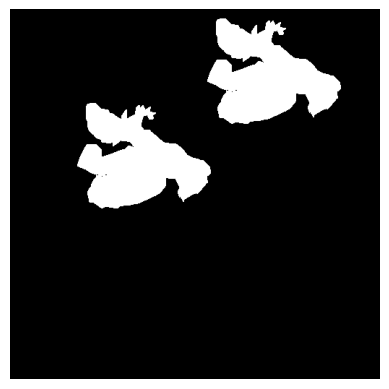

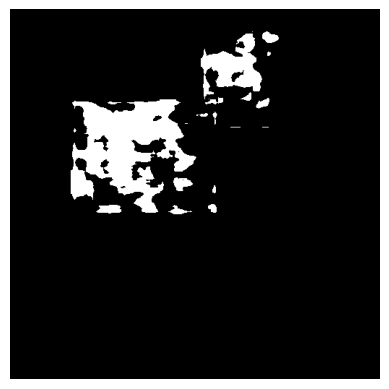

30


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


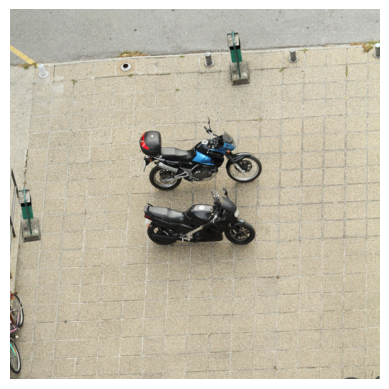

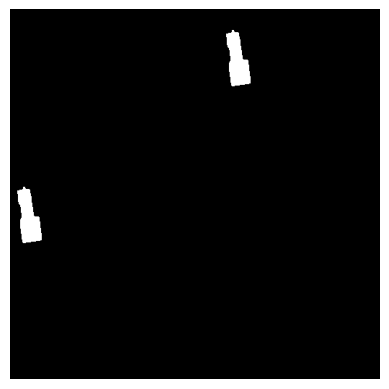

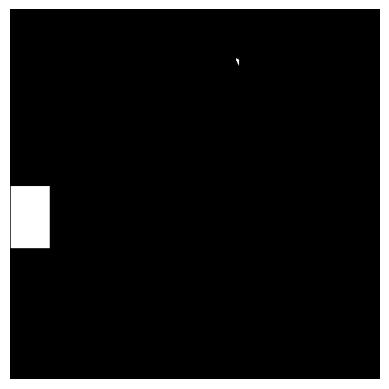

36


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


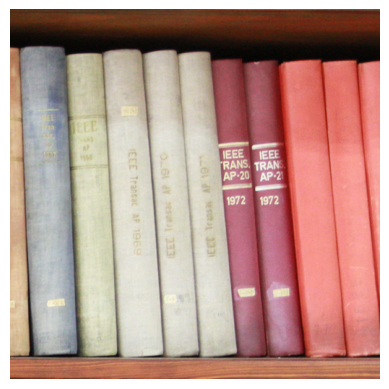

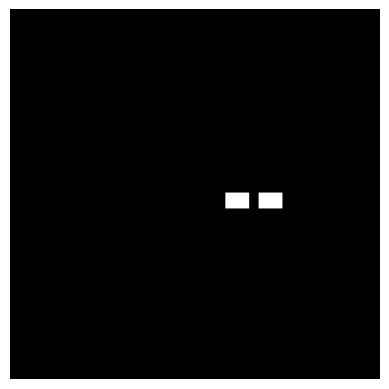

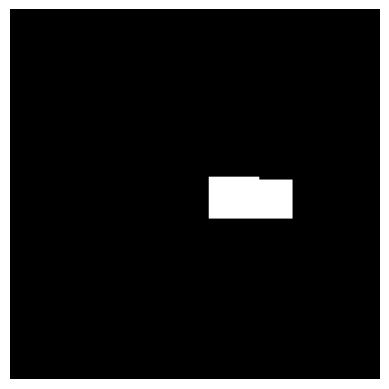

47


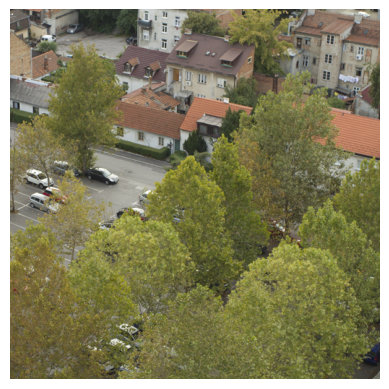

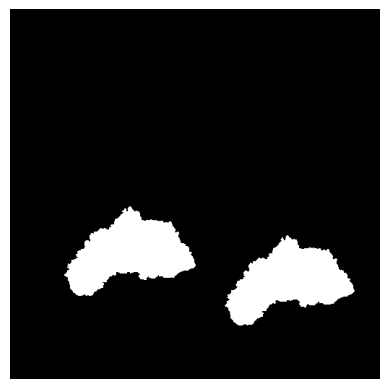

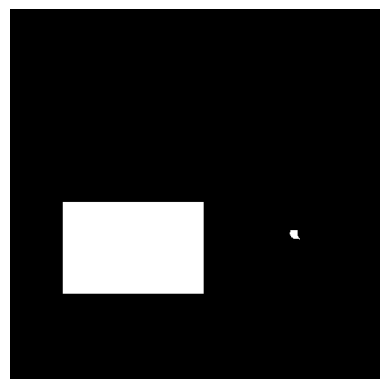

49


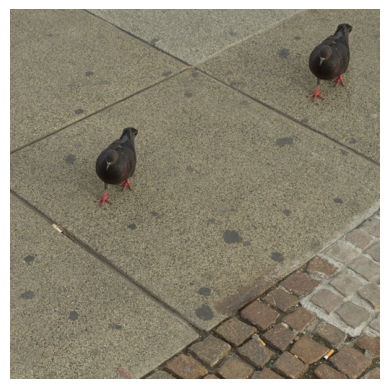

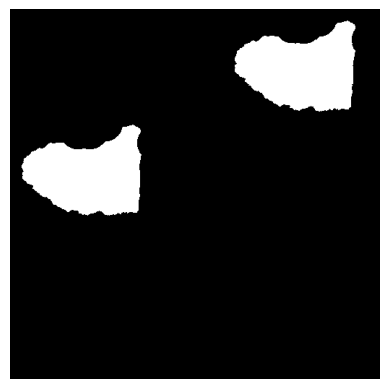

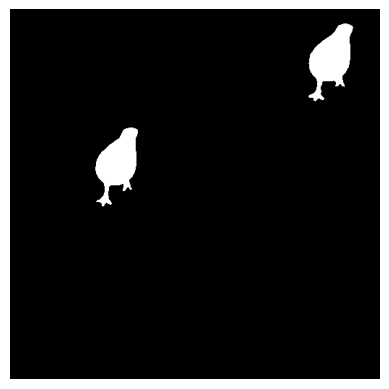

50


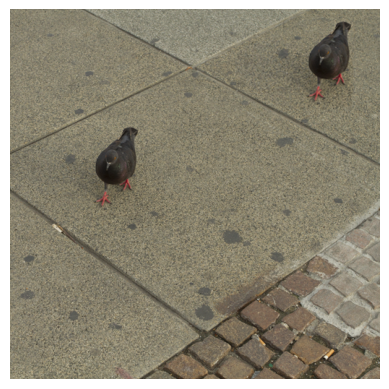

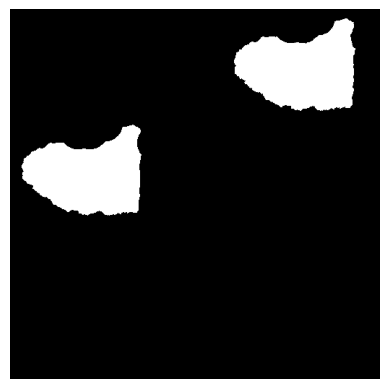

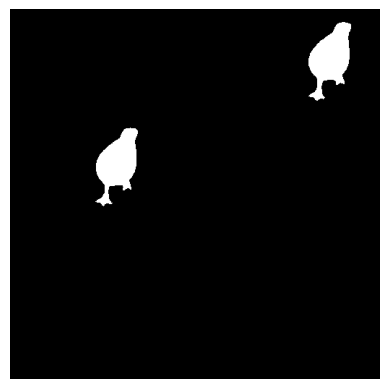

56


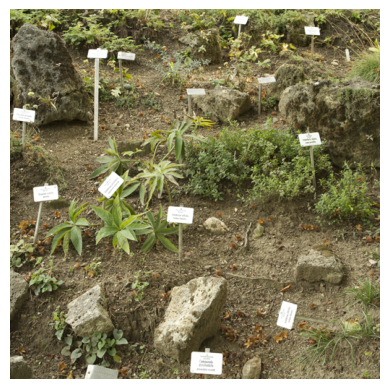

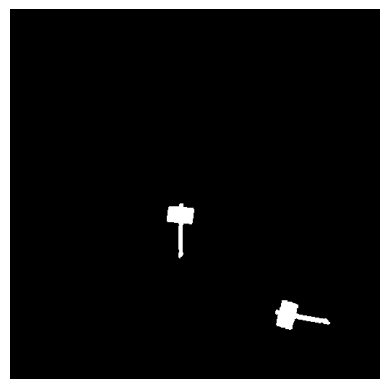

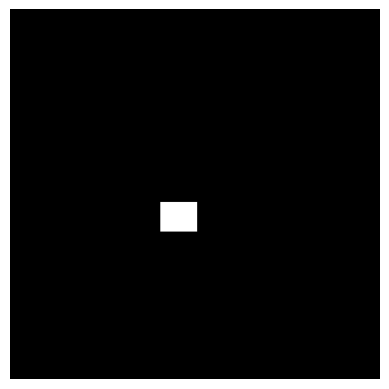

66


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


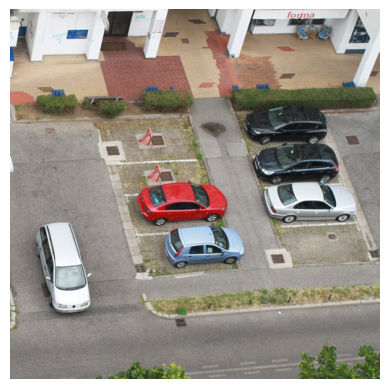

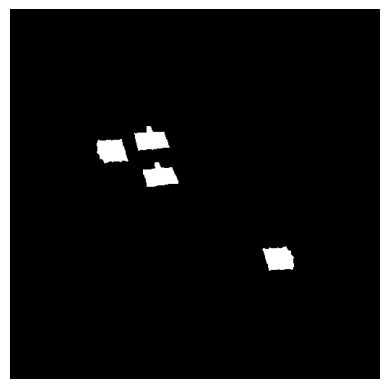

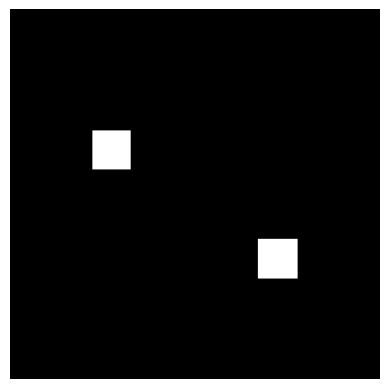

68


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


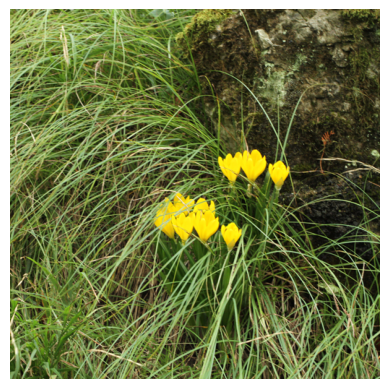

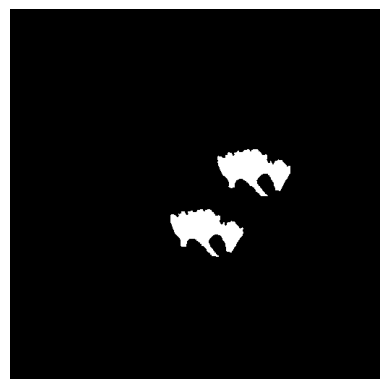

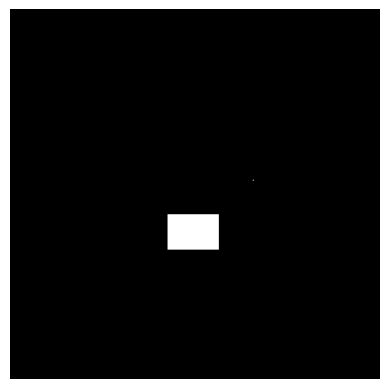

69


libpng warning: iCCP: known incorrect sRGB profile


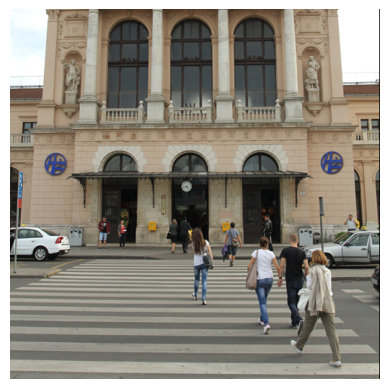

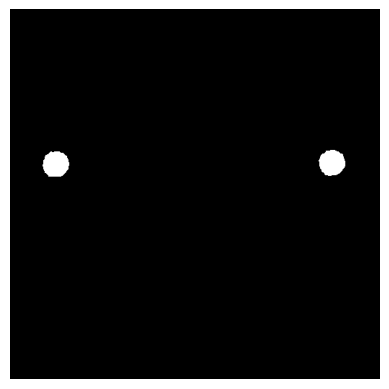

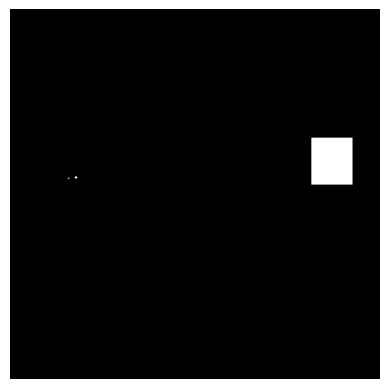

75


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


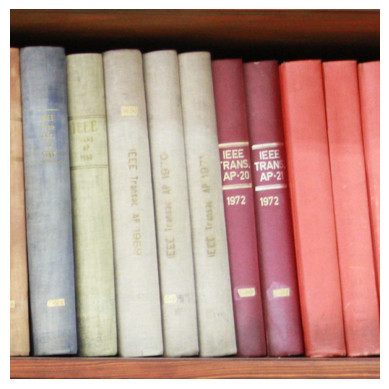

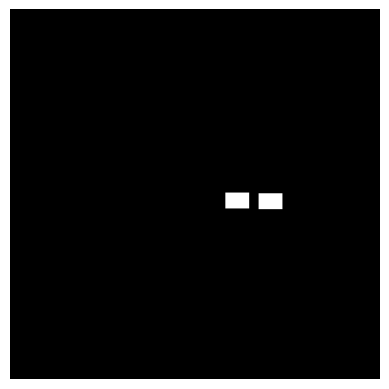

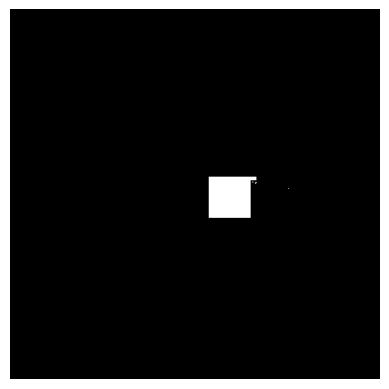

80


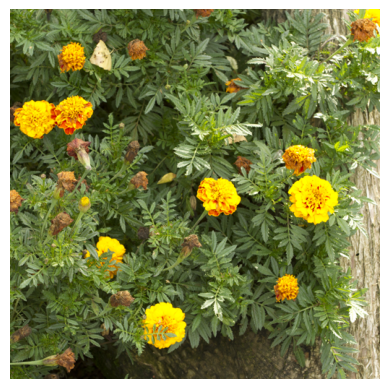

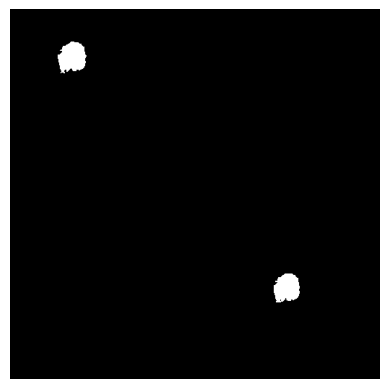

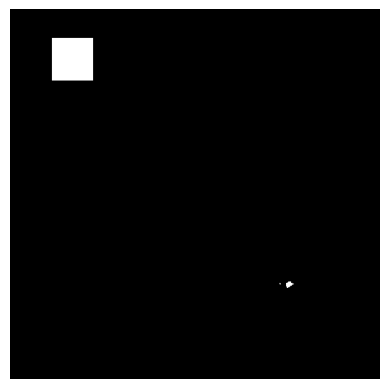

97


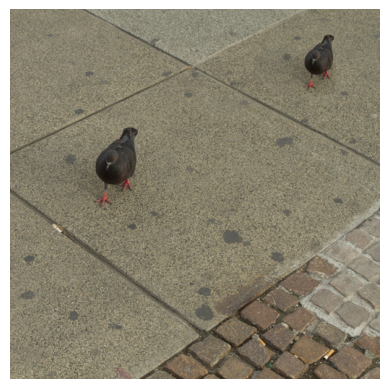

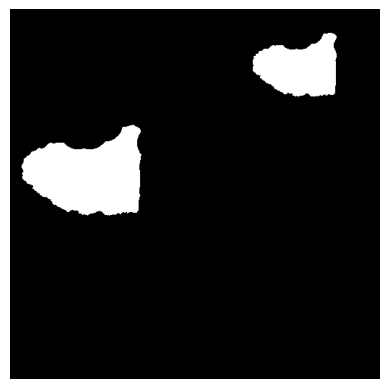

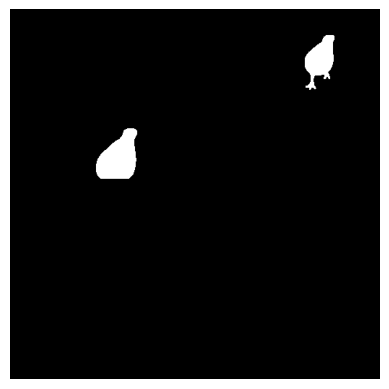

103


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


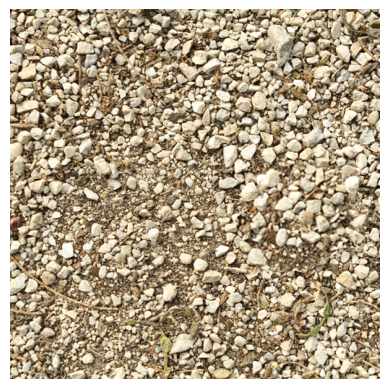

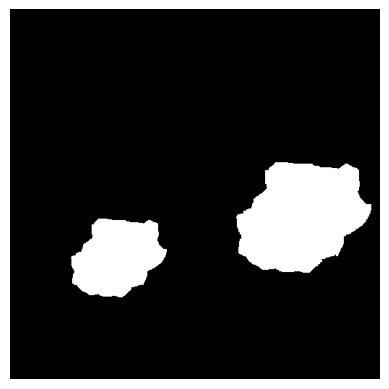

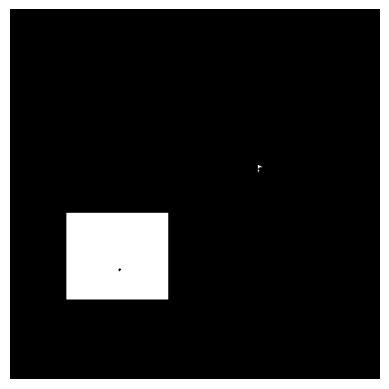

107


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


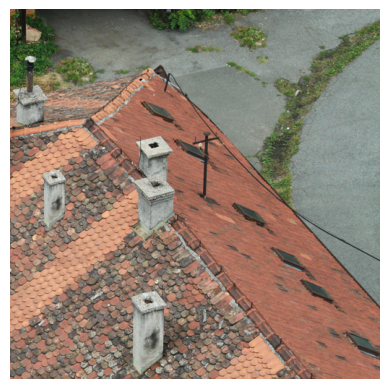

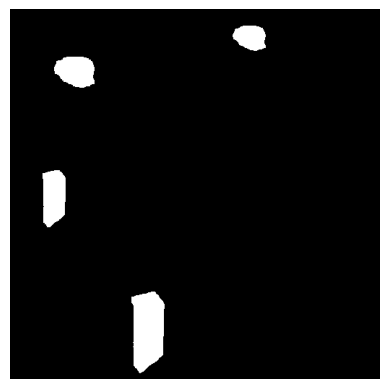

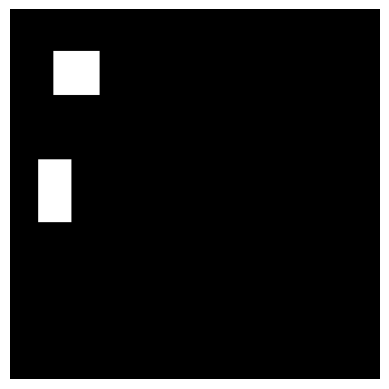

119


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


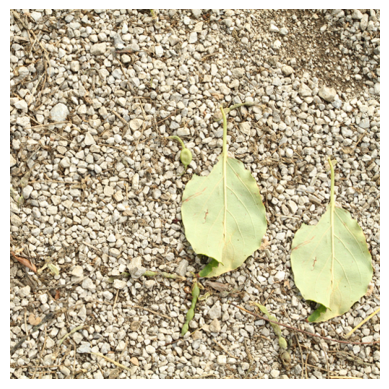

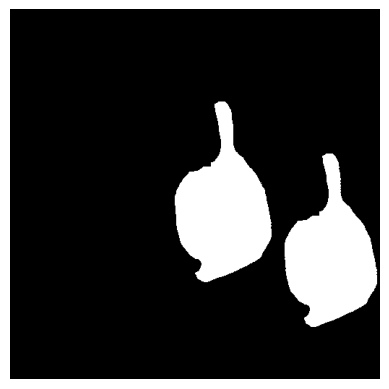

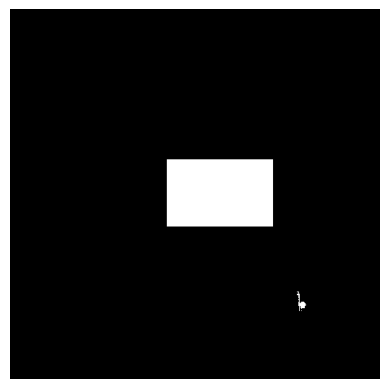

135


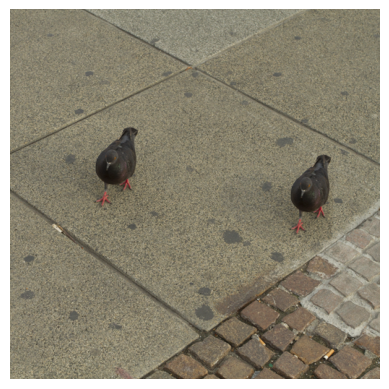

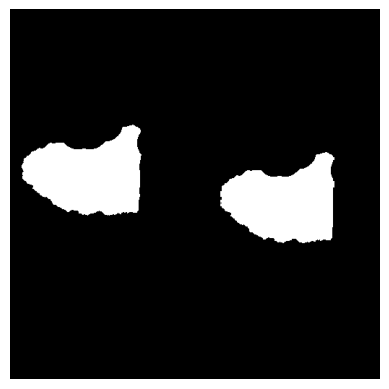

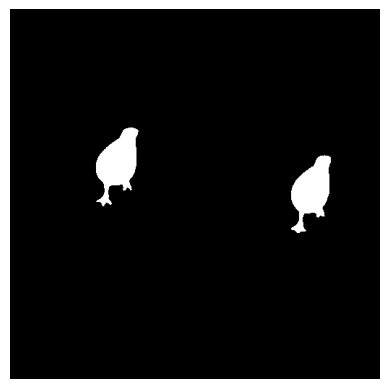

142


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


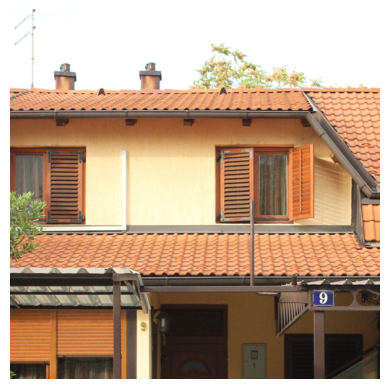

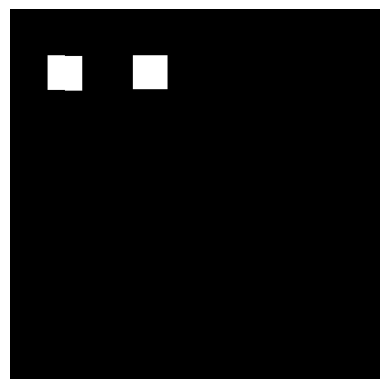

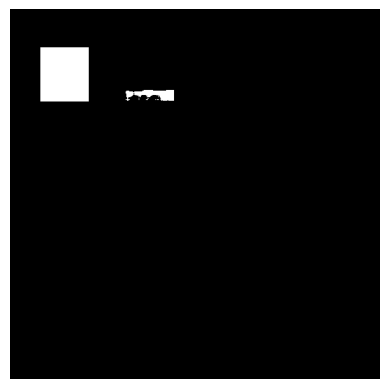

145


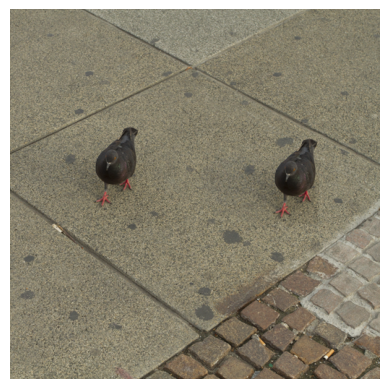

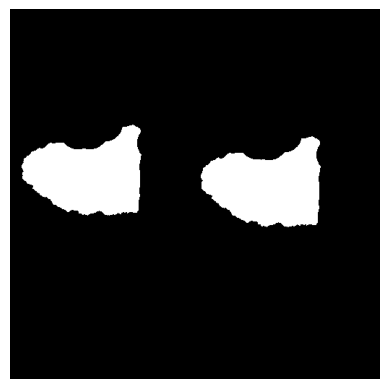

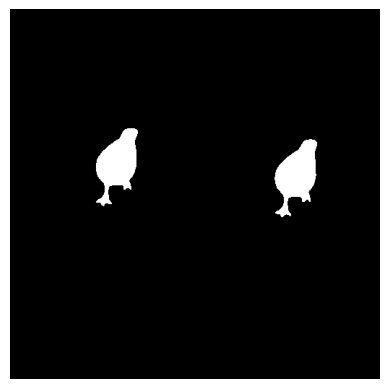

150


libpng warning: iCCP: known incorrect sRGB profile


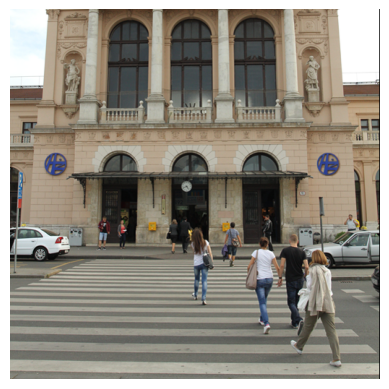

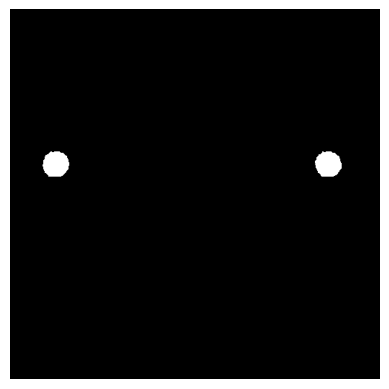

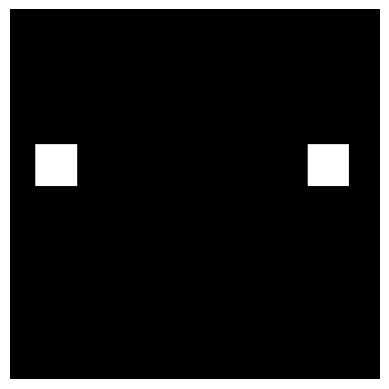

155


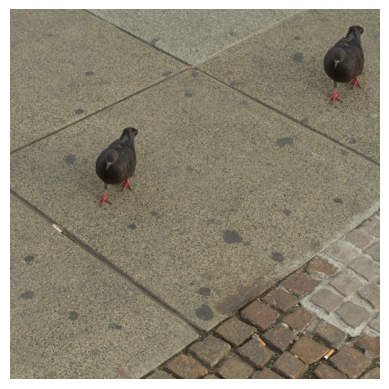

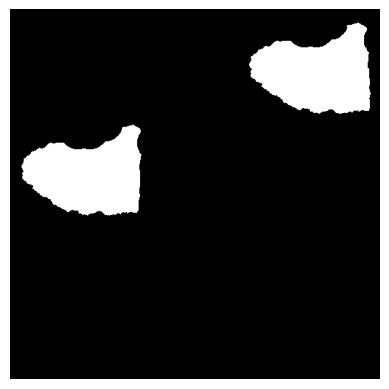

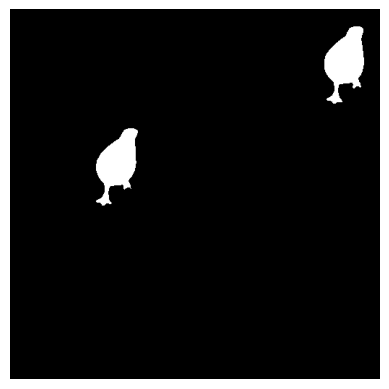

161


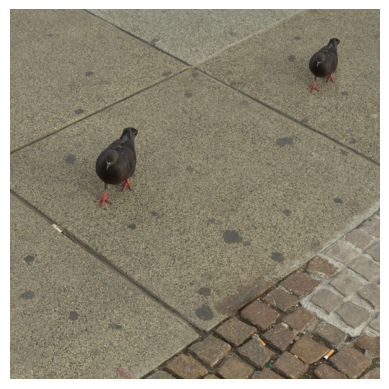

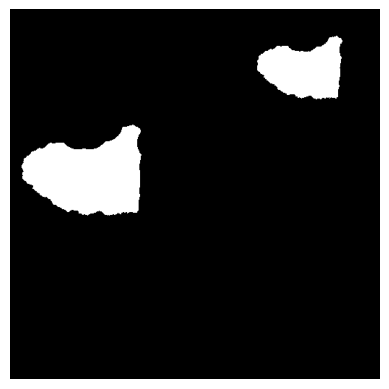

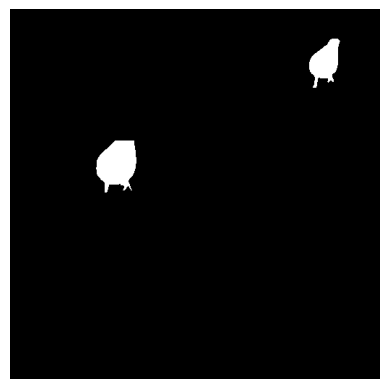

163


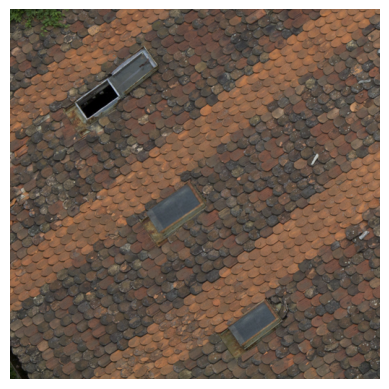

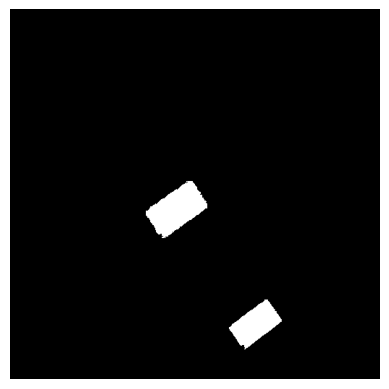

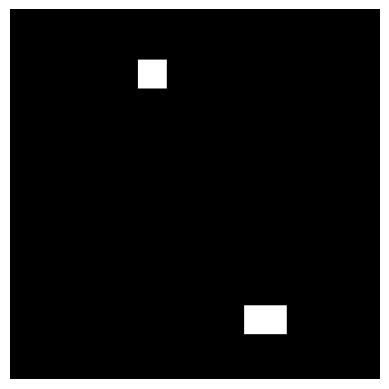

165


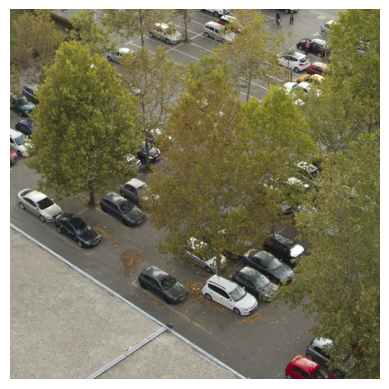

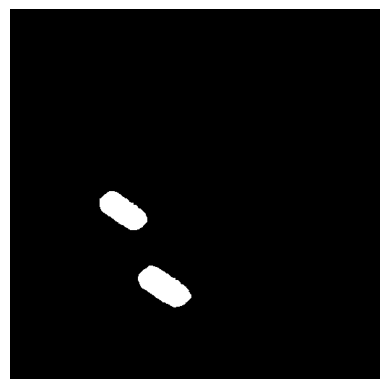

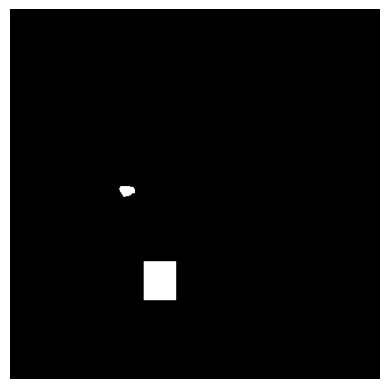

180


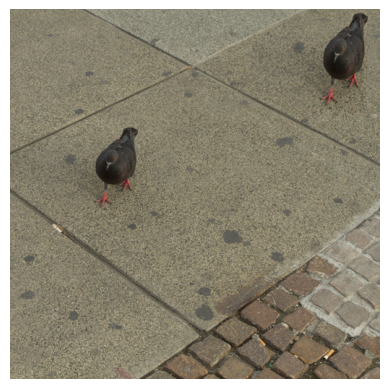

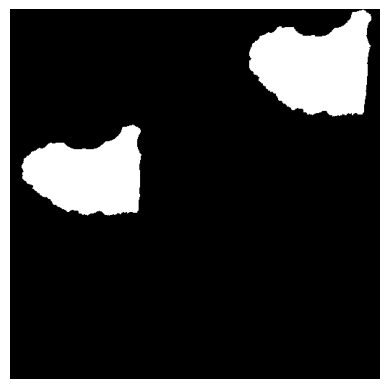

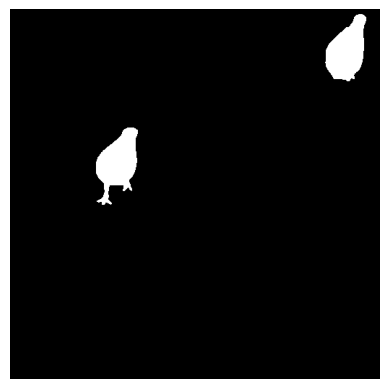

189


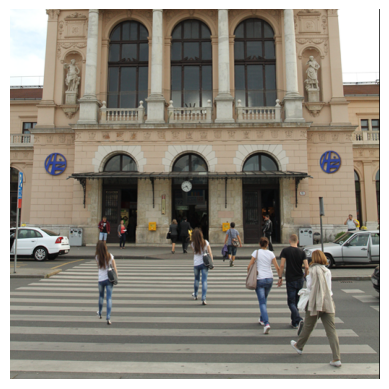

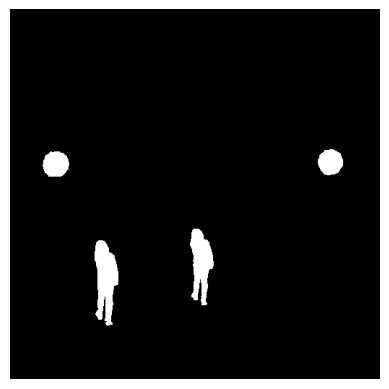

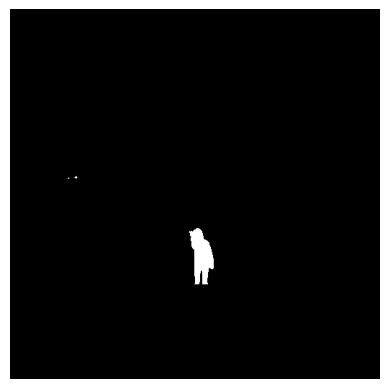

190


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


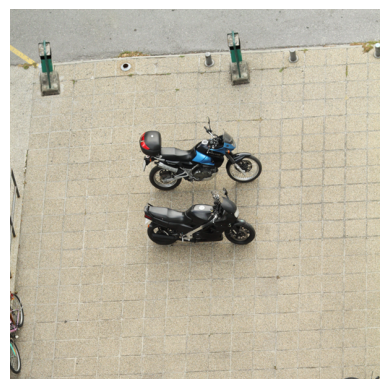

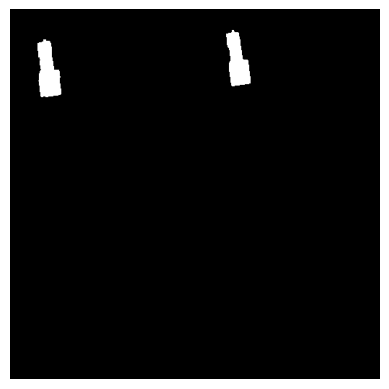

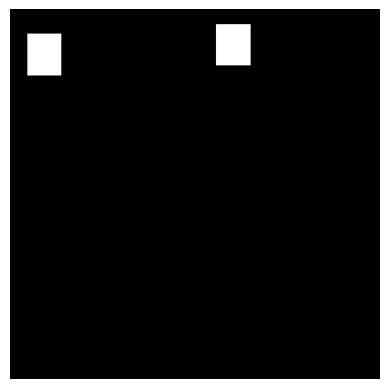

195


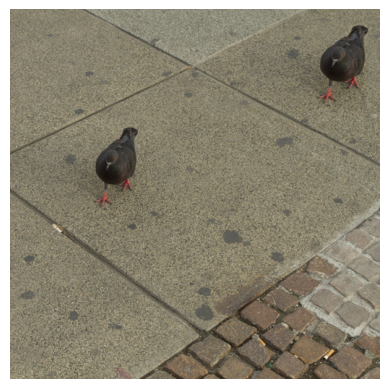

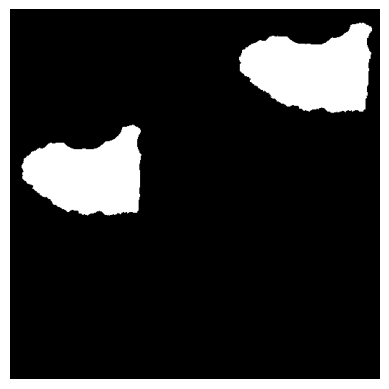

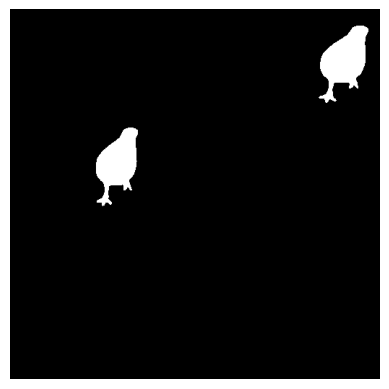

197


libpng warning: iCCP: known incorrect sRGB profile
libpng warning: iCCP: known incorrect sRGB profile


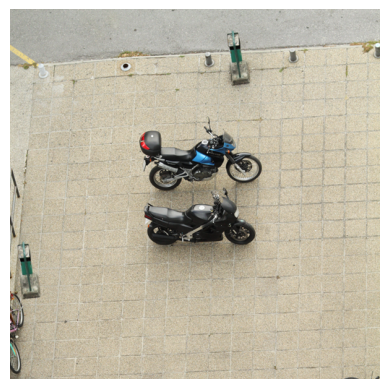

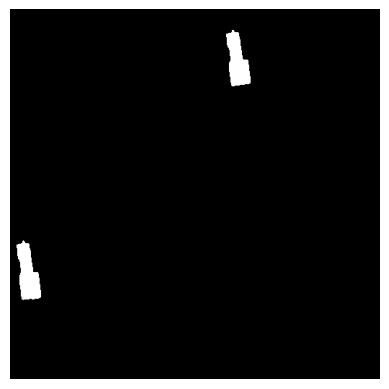

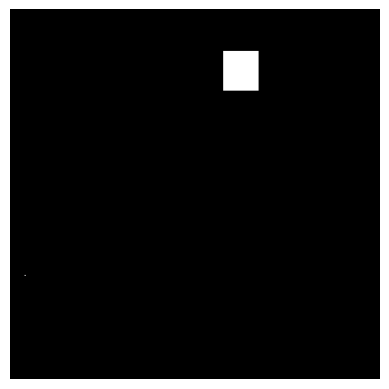

In [79]:
for i in np.where((np.array([i[3] for i in score_list]) > 0.3) & (np.array([i[3] for i in score_list]) < 0.5))[0]:
    print(i)
    image = images.get_image(i+1,"F")
    mask = images.get_image(i+1,"B")
    mask_d = images.get_image(i+1,"S")
    detected_image,boundaries = detect_and_draw(image)
    show(image)
    show(mask)
    show(mask_d)

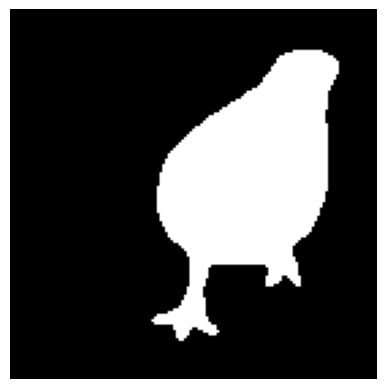

In [61]:
show(segmentation1)

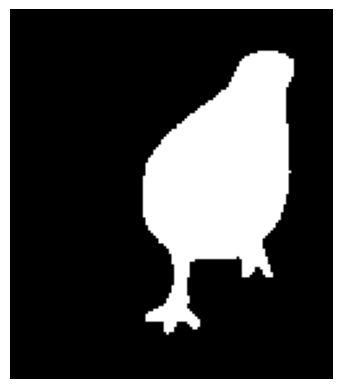

In [62]:
show(segmentation2)